# The ambient call: how much soup, and which cells are mostly it

`06_2` measured the ambient RNA of each of the 148 channels and subtracted it. It did not
throw anything away. This notebook is where that becomes a decision: it looks at how much
each channel was contaminated, how much each *cell* lost, and whether the correction did
what it was supposed to do - and then writes one boolean per cell into
`06_amb/ambient_keep.csv`, which `06_4/recelltypist_soupx.py` applies.

The split is the same one `05_1` makes between `run_infercnv.R` and `call_malignant.ipynb`:
the script produces a continuous quantity, the notebook chooses where to cut it, because
that choice is made by looking at a distribution and not by a default.

**The quantity being cut.** SoupX estimates one contamination fraction `rho` per *channel* -
it is a property of the emulsion, not of a cell - so `soupx_rho` is constant within a sample
and cannot separate cells. What varies cell by cell is how much of that channel's soup
actually landed in a given droplet, and the correction measures it directly:

    soupx_frac_removed = 1 - umis_after / umis_before

A cell whose expression profile was mostly the channel's average loses most of its counts
here; a cell with a strong, specific transcriptome loses a few percent. That is the axis to
threshold on, and the rest of this notebook is about finding where on it to cut.

**What a drop means.** These cells are not "bad cells" in the QC sense - phase 01 already
removed those (`01_2`, scrublet + the mito/gene filters). They are droplets whose remaining
signal, after the ambient component is taken out, is too thin to carry an identity. Keeping
them costs phase 05 twice: `05_1` would test them for aneuploidy against a baseline they
help define, and `05_2`/`05_3` would fit DRVI dimensions on cells whose profile is the
cohort's mean by construction.

## Libraries

In [1]:
import os
import sys
from pathlib import Path

import anndata as ad
import h5py
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse as sp

import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns

try:
    from anndata.io import read_elem
except ImportError:              # anndata < 0.11
    from anndata.experimental import read_elem

sc.settings.set_figure_params(dpi=300, facecolor="white")
sc.settings.verbosity = 1

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Configuration

`DATA_DIR` is the repo's `datasets/`, the same one every other phase reads - **not**
`datasets/06_amb`. This notebook is the last thing that looks at the two objects side by
side: `shiao.h5ad` (phase 01, uncorrected) and `06_amb/shiao_soupx_all_cells.h5ad` (06_2,
corrected, nothing dropped). What it writes goes into `06_amb/`.

In [2]:
PROJECT_DIR = Path("/home/albertoc/Desktop/QCB-Master-Thesis")
PHASE_DIR = PROJECT_DIR / "06_ambient_soupx"

DATA_DIR = Path(os.environ.get("DATA_DIR", "").strip() or PROJECT_DIR / "datasets").expanduser()
DATA_DIR = DATA_DIR.resolve()
os.environ["DATA_DIR"] = str(DATA_DIR)   # absolute from now on: re-running this cell is a no-op

AMB_DIR = DATA_DIR / "06_amb"
RAW_H5AD = DATA_DIR / "shiao.h5ad"                        # phase 01, uncorrected
SOUPX_H5AD = AMB_DIR / "shiao_soupx_all_cells.h5ad"       # 06_2, corrected, all cells
RHO_CSV = AMB_DIR / "soupx_rho.csv"
CELLS_CSV = AMB_DIR / "soupx_cells.csv"
KEEP_CSV = AMB_DIR / "ambient_keep.csv"                   # what this notebook writes

for path, produced_by in ((RAW_H5AD, "phase 01"),
                          (SOUPX_H5AD, "06_2/assemble_soupx.py"),
                          (RHO_CSV, "06_2/assemble_soupx.py"),
                          (CELLS_CSV, "06_2/assemble_soupx.py")):
    assert path.exists(), f"missing {path} (produced by {produced_by})"

print(f"DATA_DIR : {DATA_DIR}")
print(f"corrected: {SOUPX_H5AD} ({SOUPX_H5AD.stat().st_size / 1024**3:.2f} GB)")
print(f"decision : {KEEP_CSV}")

DATA_DIR : /home/albertoc/Desktop/QCB-Master-Thesis/datasets
corrected: /home/albertoc/Desktop/QCB-Master-Thesis/datasets/06_amb/shiao_soupx_all_cells.h5ad (4.34 GB)
decision : /home/albertoc/Desktop/QCB-Master-Thesis/datasets/06_amb/ambient_keep.csv


### Figures and tables

Same convention as every phase: `figures/` holds images and nothing else, `tables/` holds
the numbers behind them.

In [3]:
FIG_DIR = PHASE_DIR / "figures" / "06_3_ambient_qc"
FIG_DIR.mkdir(parents=True, exist_ok=True)
TABLE_DIR = PHASE_DIR / "tables" / "06_3_ambient_qc"
TABLE_DIR.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = FIG_DIR

QC_COLOR = "#4C72B0"
DROP_COLOR = "#C44E52"


def savefig(name, fig=None, dpi=300):
    # Save a matplotlib figure (the current one by default) into FIG_DIR.
    fig = plt.gcf() if fig is None else fig
    path = FIG_DIR / f"{name}.png"
    fig.savefig(path, dpi=dpi, bbox_inches="tight")
    print(f"[fig] {path}")
    return path


def savetable(df, name):
    path = TABLE_DIR / f"{name}.csv"
    df.to_csv(path)
    print(f"[table] {path}")
    return path

## What 06_2 measured

Two tables, both small: one row per channel and one row per cell. Everything up to the
marker check below is read from these, so the 4 GB object stays on disk until it is needed.

In [4]:
rho = pd.read_csv(RHO_CSV)
cells = pd.read_csv(CELLS_CSV, index_col=0)

print(f"{len(rho)} channels, {len(cells):,} cells")
rho.head()
cells.head()

148 channels, 619,693 cells


,sample,rho,method,tfidf_min,adjust_method,n_cells,n_genes,umis_before,umis_after,frac_removed,n_deltas,soupx_version
0,P01_A_P,0.028,autoEstCont,1,subtraction,9648,30869,25423847,24711748,0.028009,649108,1.6.2
1,P01_C_P,0.014,autoEstCont,1,subtraction,13981,30869,68854827,67891314,0.013993,878343,1.6.2
2,P02_A_P,0.012,autoEstCont,1,subtraction,10225,30869,61184063,60450839,0.011984,662650,1.6.2
3,P02_B_P,0.036,autoEstCont,1,subtraction,10714,30869,40608700,39147374,0.035986,1222542,1.6.2
4,P02_C_P,0.010,autoEstCont,1,subtraction,4532,30869,27681997,27405028,0.010005,247902,1.6.2


,sample,cohort,cell_type,soupx_rho,soupx_method,soupx_umis_before,soupx_umis_after,soupx_frac_removed
P01_A_P_AAACCTGAGATGTGTA-1,P01_A_P,Patient01,Macro-lipo,0.028,autoEstCont,6384,6159,0.035244
P01_A_P_AAACCTGAGCGCTTAT-1,P01_A_P,Patient01,cDC2,0.028,autoEstCont,2237,2188,0.021904
P01_A_P_AAACCTGAGCTCTCGG-1,P01_A_P,Patient01,cDC2,0.028,autoEstCont,4930,4779,0.030629
P01_A_P_AAACCTGAGGCATGTG-1,P01_A_P,Patient01,Mono-classical,0.028,autoEstCont,6960,6692,0.038506
P01_A_P_AAACCTGAGGCCCGTT-1,P01_A_P,Patient01,plasma_IgA,0.028,autoEstCont,2707,2642,0.024012


In [5]:
print("How rho was obtained, per channel:")
print(rho["method"].value_counts().to_string())
print()
print("rho, across channels:")
print(rho["rho"].describe().to_string())
print()
print("UMIs removed over the whole dataset: "
      f"{rho['umis_before'].sum() - rho['umis_after'].sum():,.0f} of "
      f"{rho['umis_before'].sum():,.0f} "
      f"({100 * (1 - rho['umis_after'].sum() / rho['umis_before'].sum()):.2f}%)")

How rho was obtained, per channel:
method
autoEstCont    148

rho, across channels:
count    148.000000
mean       0.013338
std        0.007357
min        0.010000
25%        0.010000
50%        0.010000
75%        0.013250
max        0.053000

UMIs removed over the whole dataset: 42,676,579 of 3,046,089,845 (1.40%)


### rho channel by channel

Two things to read here. **The level**: 10x droplet data typically sits at 2-10% ambient, and
dissociated solid tumours - which this is - run higher. **The spread**: rho varying a lot
between channels is expected (it depends on how much cell death the dissociation caused), but
a channel at the top of the range is one whose cells will lose a lot of counts below, so it is
worth knowing which patients they are before looking at the per-cell distribution.

The `method` column matters for trust: `autoEstCont` is SoupX's estimate, `fallback_prior`
means every marker-specificity threshold failed on that channel and it was corrected at
SoupX's own prior of 0.05 - a number that was not measured. Those channels are drawn apart.

(array([107.,  33.,   5.,   2.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.]),
 array([0.        , 0.01282051, 0.02564103, 0.03846154, 0.05128205,
        0.06410256, 0.07692308, 0.08974359, 0.1025641 , 0.11538462,
        0.12820513, 0.14102564, 0.15384615, 0.16666667, 0.17948718,
        0.19230769, 0.20512821, 0.21794872, 0.23076923, 0.24358974,
        0.25641026, 0.26923077, 0.28205128, 0.29487179, 0.30769231,
        0.32051282, 0.33333333, 0.34615385, 0.35897436, 0.37179487,
        0.38461538, 0.3974359 , 0.41025641, 0.42307692, 0.43589744,
        0.44871795, 0.46153846, 0.47435897, 0.48717949, 0.5       ]),
 <BarContainer object of 39 artists>)

Text(0.5, 0, 'rho (contamination fraction)')

Text(0, 0.5, 'channels')

Text(0.5, 1.0, 'Ambient fraction per channel')

Text(0.5, 0, 'cells in the channel')

Text(0, 0.5, 'rho')

Text(0.5, 1.0, 'Is rho an artefact of small channels?')

<BarContainer object of 20 artists>

[Text(0, 0, 'P30_B_P'),
 Text(0, 1, 'P18_A_P'),
 Text(0, 2, 'P53_B_N'),
 Text(0, 3, 'P17_C_P'),
 Text(0, 4, 'P12_C_P'),
 Text(0, 5, 'P10_C_P'),
 Text(0, 6, 'P23_A_P'),
 Text(0, 7, 'P66_A_N'),
 Text(0, 8, 'P09_A_P'),
 Text(0, 9, 'P66_C_P'),
 Text(0, 10, 'P43_B_P'),
 Text(0, 11, 'P19_C_P'),
 Text(0, 12, 'P46_B_N'),
 Text(0, 13, 'P01_A_P'),
 Text(0, 14, 'P45_C_P'),
 Text(0, 15, 'P16_A_P'),
 Text(0, 16, 'P02_B_P'),
 Text(0, 17, 'P52_A_N'),
 Text(0, 18, 'P43_B_N'),
 Text(0, 19, 'P52_B_P')]

Text(0.5, 0, 'rho')

Text(0.5, 1.0, 'The 20 most contaminated channels')

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/rho_per_channel.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/rho_per_channel.png')

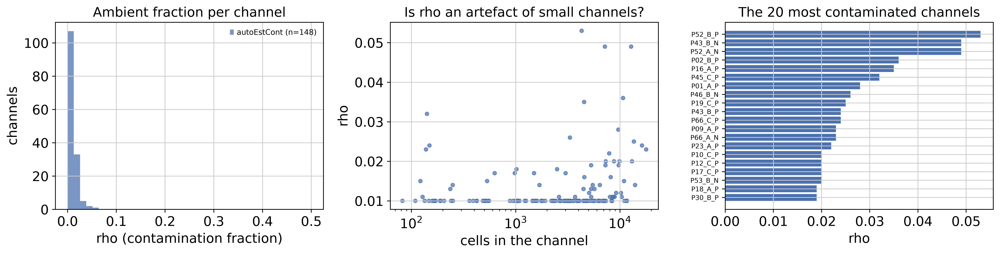

[table] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/rho_per_channel.csv


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/rho_per_channel.csv')

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

palette = {"autoEstCont": QC_COLOR, "fallback_prior": DROP_COLOR, "fixed": "#8C8C8C"}
for method, grp in rho.groupby("method"):
    axes[0].hist(grp["rho"], bins=np.linspace(0, max(0.5, rho["rho"].max()), 40),
                 alpha=0.75, label=f"{method} (n={len(grp)})", color=palette.get(method, "#999"))
axes[0].set_xlabel("rho (contamination fraction)")
axes[0].set_ylabel("channels")
axes[0].set_title("Ambient fraction per channel")
axes[0].legend(frameon=False, fontsize=8)

axes[1].scatter(rho["n_cells"], rho["rho"], s=14, alpha=0.7,
                c=[palette.get(m, "#999") for m in rho["method"]])
axes[1].set_xscale("log")
axes[1].set_xlabel("cells in the channel")
axes[1].set_ylabel("rho")
axes[1].set_title("Is rho an artefact of small channels?")

top = rho.nlargest(20, "rho").iloc[::-1]
axes[2].barh(range(len(top)), top["rho"],
             color=[palette.get(m, "#999") for m in top["method"]])
axes[2].set_yticks(range(len(top)))
axes[2].set_yticklabels(top["sample"], fontsize=7)
axes[2].set_xlabel("rho")
axes[2].set_title("The 20 most contaminated channels")

fig.tight_layout()
savefig("rho_per_channel")
plt.show()

savetable(rho.sort_values("rho", ascending=False).set_index("sample"), "rho_per_channel")

## What each cell lost

`soupx_frac_removed` is the per-cell axis. Read the panels in this order:

1. **The distribution.** A long right tail is the thing this phase is looking for: those are
   the droplets whose profile was mostly the channel average.
2. **By cell type.** If the tail were spread evenly over every label it would be a technical
   artefact of library size. If it concentrates in particular labels, that is the ambient
   problem showing its shape - and the epithelial labels are the ones phase 05 depends on.
3. **Against library size.** A small cell loses a larger *fraction* to a soup of fixed
   composition, so some correlation is expected and is not itself a problem. What matters is
   whether the tail is only small cells (then the threshold is a library-size filter under
   another name, and `01_2` already has one) or whether large cells are in it too.

(array([1.50754e+05, 3.18879e+05, 9.03810e+04, 3.06790e+04, 1.40210e+04,
        7.67500e+03, 4.37400e+03, 1.94400e+03, 6.21000e+02, 2.05000e+02,
        7.10000e+01, 2.50000e+01, 1.80000e+01, 1.10000e+01, 8.00000e+00,
        3.00000e+00, 0.00000e+00, 3.00000e+00, 0.00000e+00, 0.00000e+00,
        2.00000e+00, 3.00000e+00, 1.00000e+00, 0.00000e+00, 1.00000e+00,
        0.00000e+00, 1.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 2.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00,
        1.00000e+00, 0.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00

Text(0.5, 0, 'fraction of UMIs removed')

Text(0, 0.5, 'cells (log)')

Text(0.5, 1.0, 'Per-cell ambient burden')

<Axes: xlabel='soupx_frac_removed', ylabel='cell_type'>

Text(0, 0.5, '')

Text(0.5, 0, 'fraction of UMIs removed')

Text(0.5, 1.0, 'By phase-01 cell type')

Text(0.5, 0, 'UMIs before the correction (log)')

Text(0, 0.5, 'fraction removed')

Text(0.5, 1.0, 'Is the tail just small cells?')

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/frac_removed_distributions.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/frac_removed_distributions.png')

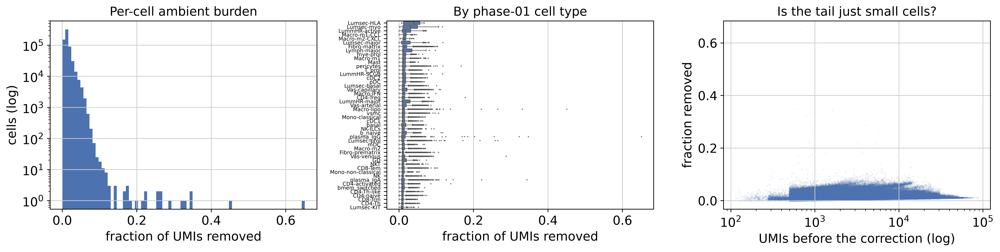

count    619693.000000
mean          0.013516
std           0.009277
min           0.000000
25%           0.008215
50%           0.010663
75%           0.015982
max           0.651095
  quantile    0.5: 0.011
  quantile    0.9: 0.024
  quantile   0.95: 0.032
  quantile   0.99: 0.050
  quantile  0.999: 0.069


In [7]:
frac = cells["soupx_frac_removed"]

fig, axes = plt.subplots(1, 3, figsize=(16, 4.2))

axes[0].hist(frac, bins=80, color=QC_COLOR)
axes[0].set_yscale("log")
axes[0].set_xlabel("fraction of UMIs removed")
axes[0].set_ylabel("cells (log)")
axes[0].set_title("Per-cell ambient burden")

order = (cells.groupby("cell_type", observed=True)["soupx_frac_removed"]
         .median().sort_values(ascending=False).index)
sns.boxplot(data=cells, y="cell_type", x="soupx_frac_removed", order=order,
            color=QC_COLOR, fliersize=0.4, linewidth=0.6, ax=axes[1])
axes[1].set_ylabel("")
axes[1].set_xlabel("fraction of UMIs removed")
axes[1].tick_params(axis="y", labelsize=6)
axes[1].set_title("By phase-01 cell type")

axes[2].scatter(cells["soupx_umis_before"], frac, s=1, alpha=0.05, color=QC_COLOR,
                rasterized=True)
axes[2].set_xscale("log")
axes[2].set_xlabel("UMIs before the correction (log)")
axes[2].set_ylabel("fraction removed")
axes[2].set_title("Is the tail just small cells?")

fig.tight_layout()
savefig("frac_removed_distributions")
plt.show()

print(frac.describe().to_string())
for q in (0.5, 0.9, 0.95, 0.99, 0.999):
    print(f"  quantile {q:>6}: {frac.quantile(q):.3f}")

### Where the soup sits

The phase-01 UMAP, coloured by how much each cell lost. That embedding was computed on the
**uncorrected** counts, which is exactly what makes it useful here: it is the map phase 01
drew, and this panel says which parts of it were being drawn by ambient RNA. It is a
landmark and nothing more - no claim in this phase rests on it.

Only `obs` and `obsm` are read, so the 4 GB matrix is not loaded.

Text(0.5, 1.0, 'Ambient burden on the phase-01 UMAP')

[]

[]

Text(-3.5638537406921387, 14.563421249389648, 'CD4-Th')

Text(-3.528883457183838, 13.859793663024902, 'CD4-Th-like')

Text(-1.3540626764297485, 13.297539710998535, 'CD4-Treg')

Text(-3.296581268310547, 14.090744018554688, 'CD4-activated')

Text(-3.9665074348449707, 13.967220306396484, 'CD4-naive')

Text(-1.8026548624038696, 16.41219711303711, 'CD8-Tem')

Text(-2.2255008220672607, 16.313701629638672, 'CD8-Trm')

Text(-0.027400696650147438, -6.824254989624023, 'Fibro-matrix')

Text(2.230046272277832, -7.161420822143555, 'Fibro-prematrix')

Text(-3.0699970722198486, 16.075551986694336, 'GD')

Text(1.2250642776489258, 1.5242657661437988, 'LummHR-SCGB')

Text(0.9520776271820068, 1.7932727336883545, 'LummHR-active')

Text(-0.34767860174179077, 1.679675817489624, 'LummHR-major')

Text(3.2471578121185303, -1.4479496479034424, 'Lumsec-HLA')

Text(2.8472156524658203, -0.6512013673782349, 'Lumsec-KIT')

Text(3.888399600982666, -0.8904770016670227, 'Lumsec-basal')

Text(2.1669323444366455, 0.7526340484619141, 'Lumsec-major')

Text(0.773125171661377, -0.728947639465332, 'Lumsec-myo')

Text(3.2110488414764404, 0.830129861831665, 'Lumsec-prol')

Text(-2.469621181488037, -0.446712464094162, 'Lymph-major')

Text(6.374017715454102, 10.02524185180664, 'Macro-IFN')

Text(6.365025997161865, 7.4732208251953125, 'Macro-lipo')

Text(6.8345537185668945, 9.601855278015137, 'Macro-m1')

Text(7.2793121337890625, 11.776264190673828, 'Macro-m1-CCL')

Text(9.899487495422363, 9.203392028808594, 'Macro-m2')

Text(8.846639633178711, 10.911445617675781, 'Macro-m2-CXCL')

Text(-2.068524122238159, 8.635858535766602, 'Mast')

Text(4.345155239105225, 11.413562774658203, 'Mono-classical')

Text(2.992018222808838, 11.51829719543457, 'Mono-non-classical')

Text(-2.2703499794006348, 19.82228660583496, 'NK')

Text(-3.2834668159484863, 19.134033203125, 'NK-ILCs')

Text(-1.3905086517333984, 18.701894760131836, 'NKT')

Text(0.170702263712883, 15.583511352539062, 'T_prol')

Text(-4.6652679443359375, -0.5572057962417603, 'Vas-arterial')

Text(-5.715511322021484, -1.2301989793777466, 'Vas-capillary')

Text(-4.083111763000488, -2.641329050064087, 'Vas-venous')

Text(-7.871695518493652, 14.144158363342285, 'b_naive')

Text(0.02208094857633114, -0.5550466775894165, 'basal')

Text(-8.14924430847168, 13.832669258117676, 'bmem_switched')

Text(1.464447259902954, 9.392538070678711, 'cDC1')

Text(2.7890465259552, 9.900371551513672, 'cDC2')

Text(0.6201130151748657, 8.522747039794922, 'mDC')

Text(4.674306392669678, 9.73409652709961, 'mye-prol')

Text(-3.0397555828094482, 6.44732666015625, 'pDC')

Text(-5.5779337882995605, -5.745361328125, 'pericytes')

Text(-7.533484935760498, 7.450326919555664, 'plasma_IgA')

Text(-6.858085632324219, 8.517744064331055, 'plasma_IgG')

Text(-6.898068904876709, -5.559060096740723, 'vsmc')

Text(0.5, 1.0, 'The same map, by phase-01 cell type')

[]

[]

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/umap_ambient_burden.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/umap_ambient_burden.png')

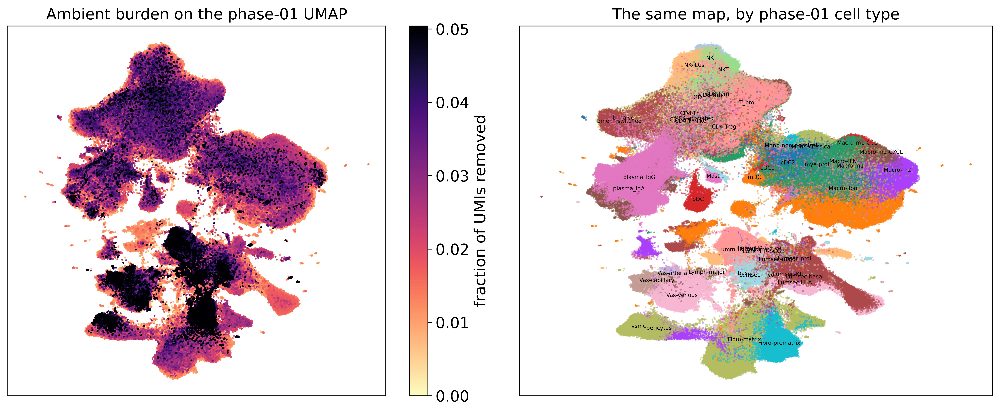

In [8]:
with h5py.File(SOUPX_H5AD, "r") as f:
    obs_names = pd.Index(read_elem(f["obs"]["_index"]))
    umap = read_elem(f["obsm"]["X_umap"]) if "X_umap" in f["obsm"] else None
    cell_type_umap = pd.Series(read_elem(f["obs"]["cell_type"]), index=obs_names)

assert umap is not None, "no obsm['X_umap'] in the corrected object"
frac_umap = cells.loc[obs_names, "soupx_frac_removed"].to_numpy()

fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))
sub = np.argsort(frac_umap)          # heaviest cells drawn last, so they are visible
sc_ = axes[0].scatter(umap[sub, 0], umap[sub, 1], c=frac_umap[sub], s=0.6,
                      cmap="magma_r", vmin=0, vmax=np.quantile(frac_umap, 0.99),
                      rasterized=True)
fig.colorbar(sc_, ax=axes[0], label="fraction of UMIs removed")
axes[0].set_title("Ambient burden on the phase-01 UMAP")
axes[0].set_xticks([]); axes[0].set_yticks([])

for label, grp in pd.DataFrame({"x": umap[:, 0], "y": umap[:, 1],
                                "t": cell_type_umap.to_numpy()}).groupby("t", observed=True):
    axes[1].scatter(grp["x"], grp["y"], s=0.4, alpha=0.5, rasterized=True)
    axes[1].annotate(label, (grp["x"].median(), grp["y"].median()), fontsize=5, ha="center")
axes[1].set_title("The same map, by phase-01 cell type")
axes[1].set_xticks([]); axes[1].set_yticks([])

fig.tight_layout()
savefig("umap_ambient_burden")
plt.show()

## Did the correction do what it was supposed to?

A contamination fraction going down is not evidence on its own - subtracting counts always
lowers something. The check that means anything is **cross-lineage expression**: a T cell
does not transcribe *EPCAM* and an epithelial cell does not transcribe *PTPRC*, so whenever
they appear together in one droplet, ambient RNA is a leading explanation. If the correction
is working, the share of epithelial cells carrying immune transcripts should fall, and the
share of immune cells carrying epithelial transcripts should fall with it - while the
lineage's **own** markers stay where they are. That last part is the control: a correction
that also flattens *EPCAM* in epithelium is removing signal, not soup.

The panel is read from both objects with a chunked pass over the cells, so neither 4 GB
matrix is loaded whole.

In [9]:
IMMUNE_MARKERS = ["PTPRC", "CD3D", "CD2", "TRBC2", "LYZ"]
EPITHELIAL_MARKERS = ["EPCAM", "KRT18", "KRT8", "KRT19", "SCGB2A2"]
PANEL = IMMUNE_MARKERS + EPITHELIAL_MARKERS
CHUNK = 50_000


def gene_panel_counts(h5ad_path, genes, chunk=CHUNK):
    # Per-cell counts for a handful of genes, without loading the matrix. Backed row
    # slicing on a CSR matrix reads only the rows asked for, so a pass in chunks touches
    # each entry once and holds `chunk` cells at a time.
    adata = ad.read_h5ad(h5ad_path, backed="r")
    present = [g for g in genes if g in adata.var_names]
    missing = [g for g in genes if g not in adata.var_names]
    if missing:
        print(f"  not in {Path(h5ad_path).name}: {missing}")
    cols = pd.Series(np.arange(adata.n_vars), index=adata.var_names)[present].to_numpy()
    out = np.zeros((adata.n_obs, len(present)), dtype=np.float32)
    for start in range(0, adata.n_obs, chunk):
        stop = min(start + chunk, adata.n_obs)
        block = sp.csr_matrix(adata.layers["counts"][start:stop, :])[:, cols]
        out[start:stop] = block.toarray()
    names = pd.Index(adata.obs_names)
    adata.file.close()
    return pd.DataFrame(out, index=names, columns=present)


print("reading the panel from the uncorrected object...")
panel_before = gene_panel_counts(RAW_H5AD, PANEL)
print("reading the panel from the corrected object...")
panel_after = gene_panel_counts(SOUPX_H5AD, PANEL)
panel_after = panel_after.reindex(panel_before.index)
panel_before.shape, panel_after.shape

reading the panel from the uncorrected object...
reading the panel from the corrected object...


((619693, 10), (619693, 10))

In [10]:
IMMUNE_LABELS = {
    "CD4-Tem", "CD4-Th", "CD4-Th-like", "CD4-Treg", "CD4-activated", "CD4-naive",
    "CD8-Tem", "CD8-Trm", "CD8-activated", "GD", "NK", "NK-ILCs", "NKT", "T_prol",
    "Macro-IFN", "Macro-lipo", "Macro-m1", "Macro-m1-CCL", "Macro-m2", "Macro-m2-CXCL",
    "Mast", "Mono-classical", "Mono-non-classical", "Neutrophil",
    "cDC1", "cDC2", "mDC", "pDC", "mye-prol",
    "b_naive", "bmem_switched", "bmem_unswitched", "plasma_IgA", "plasma_IgG",
}
EPITHELIAL_LABELS = {
    "LummHR-SCGB", "LummHR-active", "LummHR-major",
    "Lumsec-HLA", "Lumsec-KIT", "Lumsec-basal", "Lumsec-lac", "Lumsec-major",
    "Lumsec-myo", "Lumsec-prol", "basal",
}

label = cells.loc[panel_before.index, "cell_type"].astype(str)
lineage = pd.Series(np.where(label.isin(EPITHELIAL_LABELS), "epithelial",
                    np.where(label.isin(IMMUNE_LABELS), "immune", "other")),
                    index=panel_before.index)
print(lineage.value_counts().to_string())

rows = []
for lin in ("epithelial", "immune"):
    m = (lineage == lin).to_numpy()
    for gene in panel_before.columns:
        own = ((lin == "epithelial" and gene in EPITHELIAL_MARKERS)
               or (lin == "immune" and gene in IMMUNE_MARKERS))
        rows.append(dict(
            lineage=lin, gene=gene, kind="own lineage" if own else "cross-lineage",
            pct_before=100 * (panel_before.loc[m, gene] > 0).mean(),
            pct_after=100 * (panel_after.loc[m, gene] > 0).mean(),
            mean_before=panel_before.loc[m, gene].mean(),
            mean_after=panel_after.loc[m, gene].mean(),
        ))
cross = pd.DataFrame(rows)
cross["pct_change"] = cross["pct_after"] - cross["pct_before"]
savetable(cross.set_index(["lineage", "gene"]), "cross_lineage_markers")
cross

immune        443083
other         101158
epithelial     75452
[table] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/cross_lineage_markers.csv


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/cross_lineage_markers.csv')

,lineage,gene,kind,pct_before,pct_after,mean_before,mean_after,pct_change
0,epithelial,PTPRC,cross-lineage,2.230557,1.704395,0.043591,0.036699,-0.526162
1,epithelial,CD3D,cross-lineage,1.373058,1.170280,0.029781,0.026944,-0.202778
2,epithelial,CD2,cross-lineage,1.159678,1.041722,0.023194,0.021378,-0.117956
3,epithelial,TRBC2,cross-lineage,1.300164,1.039071,0.026931,0.023618,-0.261093
4,epithelial,LYZ,cross-lineage,5.501511,3.606266,0.255726,0.223732,-1.895245
5,epithelial,EPCAM,own lineage,48.546096,48.090177,1.633542,1.617386,-0.455919
6,epithelial,KRT18,own lineage,68.365318,67.845783,5.124039,5.075571,-0.519536
7,epithelial,KRT8,own lineage,65.315697,64.655675,3.718510,3.681122,-0.660022
8,epithelial,KRT19,own lineage,75.788581,75.011928,10.938278,10.840110,-0.776653
9,epithelial,SCGB2A2,own lineage,6.707576,6.349732,3.507647,3.491465,-0.357843


<BarContainer object of 10 artists>

<BarContainer object of 10 artists>

[Text(0, 0, 'CD2'),
 Text(1, 0, 'CD3D'),
 Text(2, 0, 'LYZ'),
 Text(3, 0, 'PTPRC'),
 Text(4, 0, 'TRBC2'),
 Text(5, 0, 'EPCAM'),
 Text(6, 0, 'KRT18'),
 Text(7, 0, 'KRT19'),
 Text(8, 0, 'KRT8'),
 Text(9, 0, 'SCGB2A2')]

Text(0, 0.5, '% of cells with a non-zero count')

Text(0.5, 1.0, 'epithelial cells')

<BarContainer object of 10 artists>

<BarContainer object of 10 artists>

[Text(0, 0, 'EPCAM'),
 Text(1, 0, 'KRT18'),
 Text(2, 0, 'KRT19'),
 Text(3, 0, 'KRT8'),
 Text(4, 0, 'SCGB2A2'),
 Text(5, 0, 'CD2'),
 Text(6, 0, 'CD3D'),
 Text(7, 0, 'LYZ'),
 Text(8, 0, 'PTPRC'),
 Text(9, 0, 'TRBC2')]

Text(0, 0.5, '% of cells with a non-zero count')

Text(0.5, 1.0, 'immune cells')

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/cross_lineage_markers.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/cross_lineage_markers.png')

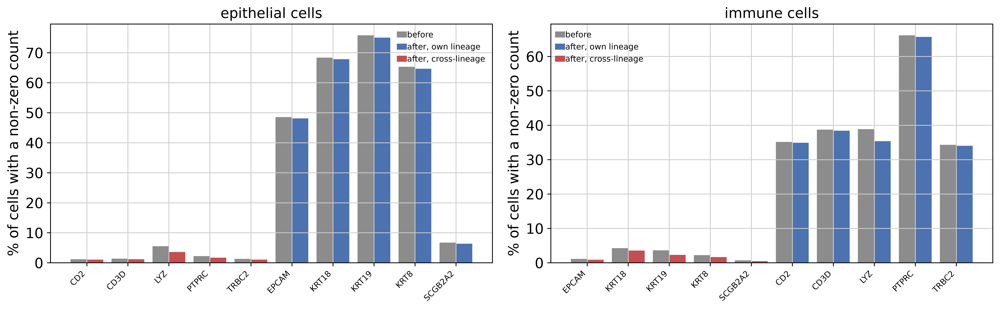

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4.5), sharey=False)
for ax, lin in zip(axes, ("epithelial", "immune")):
    d = cross[cross["lineage"] == lin].sort_values(["kind", "gene"])
    x = np.arange(len(d))
    ax.bar(x - 0.2, d["pct_before"], width=0.4, label="before", color="#8C8C8C")
    ax.bar(x + 0.2, d["pct_after"], width=0.4, label="after",
           color=[QC_COLOR if k == "own lineage" else DROP_COLOR for k in d["kind"]])
    ax.set_xticks(x)
    ax.set_xticklabels(d["gene"], rotation=45, ha="right", fontsize=8)
    ax.set_ylabel("% of cells with a non-zero count")
    ax.set_title(f"{lin} cells")
    ax.legend(handles=[Line2D([], [], color="#8C8C8C", lw=6, label="before"),
                       Line2D([], [], color=QC_COLOR, lw=6, label="after, own lineage"),
                       Line2D([], [], color=DROP_COLOR, lw=6, label="after, cross-lineage")],
              frameon=False, fontsize=8)
fig.tight_layout()
savefig("cross_lineage_markers")
plt.show()

## The threshold

**This is the cell to edit.** Everything above is evidence; the three numbers below are the
decision, and the cells after them only report what the decision costs.

- `MAX_FRAC_REMOVED` - the main axis. A cell that lost more than this share of its counts to
  the soup has too little left to be read as a cell. Set it by looking at the right tail of
  the first panel and at where the cross-lineage signal lives; the quantiles printed above
  say what each value costs in cells.
- `MIN_UMIS_AFTER` - a floor on what is left. A cell can pass the fraction test and still be
  a 40-UMI droplet after correction. Phase 01 filtered on the *uncorrected* totals, so this
  is the first chance to filter on the real ones.
- `MIN_GENES_AFTER` - the same idea in genes. `05_2` applies `MIN_GENES = 100` to its subset;
  this is deliberately looser, because dropping a cell here removes it from the inferCNV run
  of `05_1` as well, and that is a stronger action than dropping it from one subset.

Setting `MAX_FRAC_REMOVED = 1.0` and the two floors to 0 keeps every cell: the counts are
still corrected, and the phase becomes a pure decontamination with no cell filter. That is a
legitimate outcome of this notebook and should be recorded as one if the tail turns out to be
thin.

In [12]:
MAX_FRAC_REMOVED = 0.50   # a cell that lost more than half its counts to the soup
MIN_UMIS_AFTER = 200      # ...or has fewer than this many left
MIN_GENES_AFTER = 100     # ...or expresses fewer than this many genes
DROP_FALLBACK_CHANNELS = False   # also drop channels whose rho was never estimated

In [13]:
# n_genes and total counts AFTER the correction: assemble_soupx.py recomputed the QC columns
# on the corrected matrix and kept the phase-01 ones as <name>_precorrection.
with h5py.File(SOUPX_H5AD, "r") as f:
    qc = pd.DataFrame({
        "total_counts": read_elem(f["obs"]["total_counts"]),
        "n_genes_by_counts": read_elem(f["obs"]["n_genes_by_counts"]),
        "total_counts_precorrection": read_elem(f["obs"]["total_counts_precorrection"]),
        "n_genes_by_counts_precorrection": read_elem(f["obs"]["n_genes_by_counts_precorrection"]),
    }, index=pd.Index(read_elem(f["obs"]["_index"])))
qc = qc.reindex(cells.index)

fail_frac = (cells["soupx_frac_removed"] > MAX_FRAC_REMOVED).to_numpy()
fail_umis = (qc["total_counts"] < MIN_UMIS_AFTER).to_numpy()
fail_genes = (qc["n_genes_by_counts"] < MIN_GENES_AFTER).to_numpy()
fail_channel = (cells["soupx_method"] == "fallback_prior").to_numpy() if DROP_FALLBACK_CHANNELS \
    else np.zeros(len(cells), dtype=bool)

drop = fail_frac | fail_umis | fail_genes | fail_channel
keep = ~drop

reasons = pd.DataFrame({
    "frac_removed > threshold": fail_frac,
    "too few UMIs left": fail_umis,
    "too few genes left": fail_genes,
    "channel rho not estimated": fail_channel,
}).sum()
print(f"MAX_FRAC_REMOVED = {MAX_FRAC_REMOVED} | MIN_UMIS_AFTER = {MIN_UMIS_AFTER} | "
      f"MIN_GENES_AFTER = {MIN_GENES_AFTER}")
print()
print("cells failing each criterion (a cell can fail several):")
print(reasons.to_string())
print()
print(f"dropped: {drop.sum():,} of {len(drop):,} ({drop.mean():.2%})")
print(f"kept   : {keep.sum():,}")

MAX_FRAC_REMOVED = 0.5 | MIN_UMIS_AFTER = 200 | MIN_GENES_AFTER = 100

cells failing each criterion (a cell can fail several):
frac_removed > threshold       1
too few UMIs left            127
too few genes left           149
channel rho not estimated      0

dropped: 276 of 619,693 (0.04%)
kept   : 619,417


(array([1.50754e+05, 3.18879e+05, 9.03810e+04, 3.06790e+04, 1.40210e+04,
        7.67500e+03, 4.37400e+03, 1.94400e+03, 6.21000e+02, 2.05000e+02,
        7.10000e+01, 2.50000e+01, 1.80000e+01, 1.10000e+01, 8.00000e+00,
        3.00000e+00, 0.00000e+00, 3.00000e+00, 0.00000e+00, 0.00000e+00,
        2.00000e+00, 3.00000e+00, 1.00000e+00, 0.00000e+00, 1.00000e+00,
        0.00000e+00, 1.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 2.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00,
        1.00000e+00, 0.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00

Text(0.5, 0, 'fraction of UMIs removed')

Text(0, 0.5, 'cells (log)')

Text(0.5, 1.0, 'Where the cut falls')

Text(0.5, 0, 'UMIs left after the correction (log)')

Text(0, 0.5, 'fraction removed')

Text(0.5, 1.0, 'What the three criteria remove together')

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/ambient_threshold.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/ambient_threshold.png')

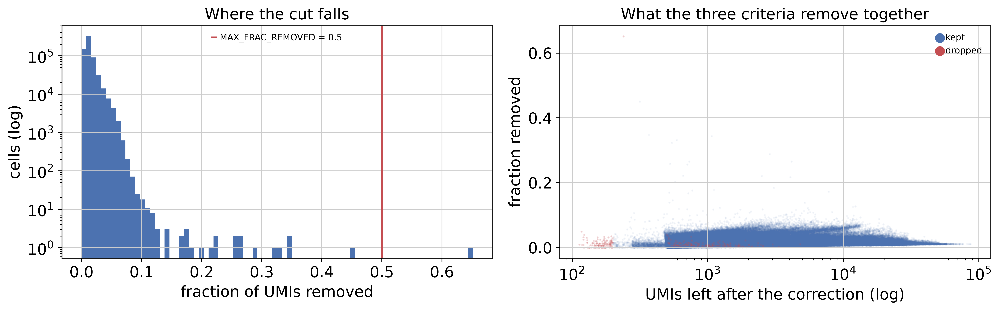

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.2))

axes[0].hist(cells["soupx_frac_removed"], bins=80, color=QC_COLOR)
axes[0].axvline(MAX_FRAC_REMOVED, color=DROP_COLOR, lw=1.5,
                label=f"MAX_FRAC_REMOVED = {MAX_FRAC_REMOVED}")
axes[0].set_yscale("log")
axes[0].set_xlabel("fraction of UMIs removed")
axes[0].set_ylabel("cells (log)")
axes[0].legend(frameon=False, fontsize=8)
axes[0].set_title("Where the cut falls")

axes[1].scatter(qc.loc[keep, "total_counts"], cells.loc[keep, "soupx_frac_removed"],
                s=1, alpha=0.05, color=QC_COLOR, rasterized=True, label="kept")
axes[1].scatter(qc.loc[drop, "total_counts"], cells.loc[drop, "soupx_frac_removed"],
                s=1, alpha=0.15, color=DROP_COLOR, rasterized=True, label="dropped")
axes[1].set_xscale("log")
axes[1].set_xlabel("UMIs left after the correction (log)")
axes[1].set_ylabel("fraction removed")
axes[1].set_title("What the three criteria remove together")
leg = axes[1].legend(frameon=False, fontsize=8, markerscale=8)
for handle in leg.legend_handles:
    handle.set_alpha(1)

fig.tight_layout()
savefig("ambient_threshold")
plt.show()

### What the cut costs

Two tables that matter more than the totals, because they are what phase 05 will see.

**By cell type**: the epithelial labels feed `05_1`'s observed set, and T/NK and myeloid feed
its diploid reference. A cut that removes half the myeloid cells of a cohort changes the
baseline every CNV call in that cohort is measured against.

**By cohort**: `05_2` drops cohorts under `MIN_CELLS_PER_COHORT = 200` malignant cells, and
19 of 34 cohorts survived that in the uncorrected run. A cohort losing cells here can fall
below the line later, so the epithelial column is the one to watch.

In [15]:
by_type = pd.DataFrame({
    "cells": cells.groupby("cell_type", observed=True).size(),
    "dropped": cells.assign(d=drop).groupby("cell_type", observed=True)["d"].sum(),
})
by_type["kept"] = by_type["cells"] - by_type["dropped"]
by_type["pct_dropped"] = 100 * by_type["dropped"] / by_type["cells"]
by_type = by_type.sort_values("pct_dropped", ascending=False)
savetable(by_type, "dropped_by_cell_type")
by_type.head(20)

[table] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/dropped_by_cell_type.csv


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/dropped_by_cell_type.csv')

,cells,dropped,kept,pct_dropped
cell_type,,,,
pericytes,6355,63,6292,0.991345
Lumsec-major,1417,13,1404,0.917431
basal,3317,17,3300,0.512511
plasma_IgG,29664,68,29596,0.229234
CD4-activated,13634,23,13611,0.168696
plasma_IgA,12568,19,12549,0.151178
Lumsec-KIT,1344,2,1342,0.148810
Lymph-major,1018,1,1017,0.098232
vsmc,6789,5,6784,0.073649


[table] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/dropped_by_cohort.csv


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/dropped_by_cohort.csv')

<BarContainer object of 34 artists>

<BarContainer object of 34 artists>

[Text(0, 0, 'Patient66'),
 Text(0, 1, 'Patient03'),
 Text(0, 2, 'Patient45'),
 Text(0, 3, 'Patient63'),
 Text(0, 4, 'Patient02'),
 Text(0, 5, 'Patient01'),
 Text(0, 6, 'Patient07'),
 Text(0, 7, 'Patient04'),
 Text(0, 8, 'Patient05'),
 Text(0, 9, 'Patient06'),
 Text(0, 10, 'Patient12'),
 Text(0, 11, 'Patient15'),
 Text(0, 12, 'Patient16'),
 Text(0, 13, 'Patient17'),
 Text(0, 14, 'Patient18'),
 Text(0, 15, 'Patient09'),
 Text(0, 16, 'Patient10'),
 Text(0, 17, 'Patient11'),
 Text(0, 18, 'Patient23'),
 Text(0, 19, 'Patient20'),
 Text(0, 20, 'Patient19'),
 Text(0, 21, 'Patient26'),
 Text(0, 22, 'Patient42'),
 Text(0, 23, 'Patient43'),
 Text(0, 24, 'Patient39'),
 Text(0, 25, 'Patient30'),
 Text(0, 26, 'Patient47'),
 Text(0, 27, 'Patient46'),
 Text(0, 28, 'Patient48'),
 Text(0, 29, 'Patient52'),
 Text(0, 30, 'Patient56'),
 Text(0, 31, 'Patient53'),
 Text(0, 32, 'Patient57'),
 Text(0, 33, 'Patient64')]

Text(0.5, 0, 'epithelial cells (log)')

Text(0.5, 1.0, 'What phase 05 will have to work with, per cohort')

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/epithelial_cells_per_cohort.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/figures/06_3_ambient_qc/epithelial_cells_per_cohort.png')

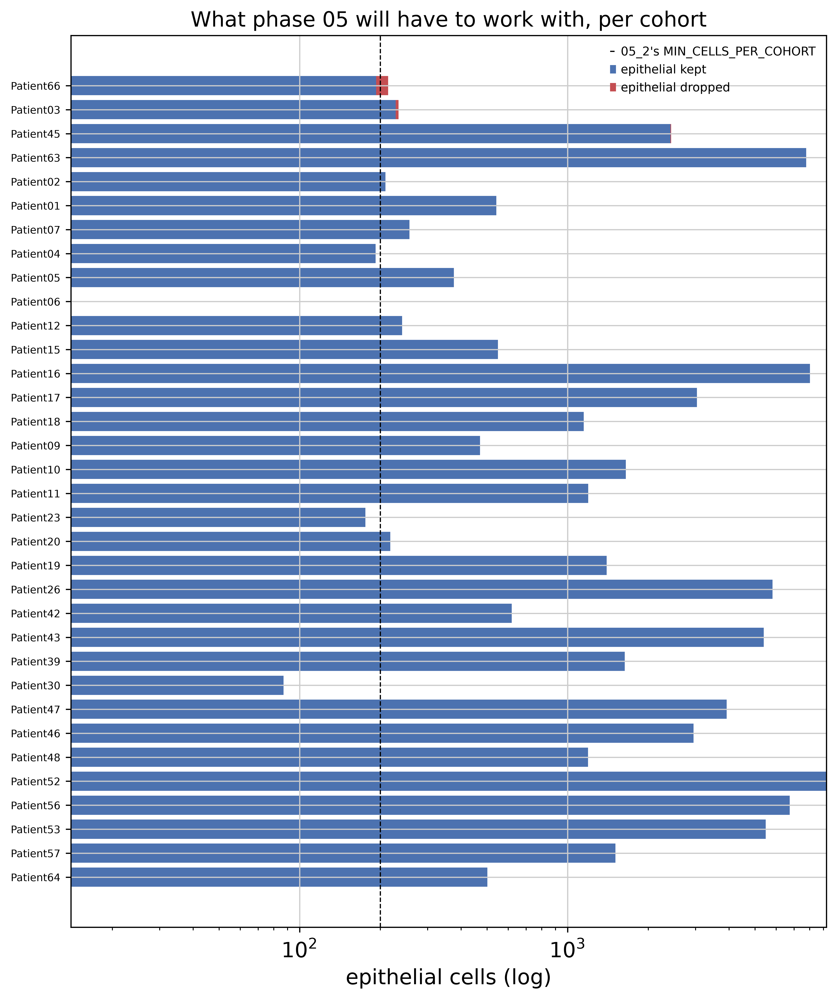

,cells,dropped,epi_before,epi_after,pct_dropped,epi_pct_lost
cohort,,,,,,
Patient66,5065,47,214,193,0.927937,9.813084
Patient03,11820,57,234,228,0.482234,2.564103
Patient45,10980,35,2434,2420,0.318761,0.575185
Patient63,22284,11,7771,7766,0.049363,0.064342
Patient02,25471,8,209,209,0.031408,0.000000
Patient01,23629,3,542,542,0.012696,0.000000
Patient07,8358,0,257,257,0.000000,0.000000
Patient04,7690,0,192,192,0.000000,0.000000
Patient05,15006,5,376,376,0.033320,0.000000


In [16]:
is_epi = cells["cell_type"].astype(str).isin(EPITHELIAL_LABELS).to_numpy()
by_cohort = pd.DataFrame({
    "cells": cells.groupby("cohort", observed=True).size(),
    "dropped": cells.assign(d=drop).groupby("cohort", observed=True)["d"].sum(),
    "epi_before": cells.assign(e=is_epi).groupby("cohort", observed=True)["e"].sum(),
    "epi_after": cells.assign(e=is_epi & keep).groupby("cohort", observed=True)["e"].sum(),
})
by_cohort["pct_dropped"] = 100 * by_cohort["dropped"] / by_cohort["cells"]
by_cohort["epi_pct_lost"] = 100 * (1 - by_cohort["epi_after"] / by_cohort["epi_before"])
by_cohort = by_cohort.sort_values("epi_pct_lost", ascending=False)
savetable(by_cohort, "dropped_by_cohort")

fig, ax = plt.subplots(figsize=(8, max(4, 0.28 * len(by_cohort))))
ax.barh(range(len(by_cohort)), by_cohort["epi_after"], color=QC_COLOR, label="epithelial kept")
ax.barh(range(len(by_cohort)), by_cohort["epi_before"] - by_cohort["epi_after"],
        left=by_cohort["epi_after"], color=DROP_COLOR, label="epithelial dropped")
ax.axvline(200, color="black", lw=0.8, ls="--", label="05_2's MIN_CELLS_PER_COHORT")
ax.set_yticks(range(len(by_cohort)))
ax.set_yticklabels(by_cohort.index, fontsize=7)
ax.invert_yaxis()
ax.set_xscale("log")
ax.set_xlabel("epithelial cells (log)")
ax.set_title("What phase 05 will have to work with, per cohort")
ax.legend(frameon=False, fontsize=8)
fig.tight_layout()
savefig("epithelial_cells_per_cohort")
plt.show()

by_cohort.head(15)

## Write the decision

One row per cell of `shiao_soupx_all_cells.h5ad`, dropped cells included - `06_4` asserts the
table covers the object exactly, so a notebook run against a different object fails loudly
instead of applying a stale call. The reason columns are carried along so the table explains
itself without this notebook.

In [17]:
decision = pd.DataFrame({
    "ambient_keep": keep,
    "soupx_frac_removed": cells["soupx_frac_removed"].to_numpy(),
    "soupx_rho": cells["soupx_rho"].to_numpy(),
    "soupx_method": cells["soupx_method"].astype(str).to_numpy(),
    "total_counts_after": qc["total_counts"].to_numpy(),
    "n_genes_after": qc["n_genes_by_counts"].to_numpy(),
    "fail_frac_removed": fail_frac,
    "fail_min_umis": fail_umis,
    "fail_min_genes": fail_genes,
    "fail_channel": fail_channel,
}, index=cells.index)
decision.index.name = cells.index.name or "cell"

with h5py.File(SOUPX_H5AD, "r") as f:
    obj_cells = pd.Index(read_elem(f["obs"]["_index"]))
assert len(decision.index.difference(obj_cells)) == 0, \
    "the decision table has rows the object does not"
assert len(obj_cells.difference(decision.index)) == 0, \
    "the object has cells the decision table does not cover"

decision = decision.loc[obj_cells]
decision.to_csv(KEEP_CSV)
print(f"[decision] {KEEP_CSV}")
print(f"kept {decision['ambient_keep'].sum():,} of {len(decision):,} cells "
      f"({decision['ambient_keep'].mean():.2%})")

# The thresholds themselves, so the CSV is not the only record of what was chosen.
params = pd.Series({
    "MAX_FRAC_REMOVED": MAX_FRAC_REMOVED,
    "MIN_UMIS_AFTER": MIN_UMIS_AFTER,
    "MIN_GENES_AFTER": MIN_GENES_AFTER,
    "DROP_FALLBACK_CHANNELS": DROP_FALLBACK_CHANNELS,
    "n_cells_in": len(decision),
    "n_cells_kept": int(decision["ambient_keep"].sum()),
}, name="value")
savetable(params.to_frame(), "ambient_thresholds")
params

[decision] /home/albertoc/Desktop/QCB-Master-Thesis/datasets/06_amb/ambient_keep.csv
kept 619,417 of 619,693 cells (99.96%)
[table] /home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/ambient_thresholds.csv


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/06_ambient_soupx/tables/06_3_ambient_qc/ambient_thresholds.csv')

MAX_FRAC_REMOVED             0.5
MIN_UMIS_AFTER               200
MIN_GENES_AFTER              100
DROP_FALLBACK_CHANNELS     False
n_cells_in                619693
n_cells_kept              619417
Name: value, dtype: object

## Next

```bash
export DATA_DIR=~/Desktop/QCB-Master-Thesis/datasets
cd ../06_4_recelltypist && python3 recelltypist_soupx.py
```

That applies this table, re-runs CellTypist on the corrected counts of the cells kept here,
and writes `06_amb/shiao.h5ad` - the object phase 05 reads when it is pointed at `06_amb/`
as its `DATA_DIR`. See the phase README for that last step and for what it does *not* do to
phase 05's own files.